In [2]:
# !pip install scikit-image

import numpy as np
import pandas as pd

from PIL import Image

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from pathlib import Path

from tqdm import tqdm

import os
import glob
import json
import random

import skimage as ski

from sklearn.metrics import average_precision_score
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from torchvision.io import read_image
import segmentation_models_pytorch as smp
from segmentation_models_pytorch import losses


from typing import List, Tuple
from enum import IntEnum
import time

d:\User\yannick\envs\hacking_the_human\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [4]:
on_pc = os.path.isdir('data')
if on_pc: 
    data_directory = "data"
else:
    data_directory = "/kaggle/input/hubmap-hacking-the-human-vasculature"

# Goals of the Competition
Goal of the Competition
The goal of this competition is to segment instances of microvascular structures, including capillaries, arterioles, and venules. You'll create a model trained on 2D PAS-stained histology images from healthy human kidney tissue slides.

Your help in automating the segmentation of microvasculature structures will improve researchers' understanding of how the blood vessels are arranged in human tissues

# Dataset description
Your goal in this competition is to locate microvasculature structures (blood vessels) within human kidney histology slides.

The competition data comprises tiles extracted from five Whole Slide Images (WSI) split into two datasets. Tiles from Dataset 1 have annotations that have been expert reviewed. Dataset 2 comprises the remaining tiles from these same WSIs and contain sparse annotations that have not been expert reviewed.

- All of the test set tiles are from Dataset 1.
- Two of the WSIs make up the training set, two WSIs make up the public test set, and one WSI makes up the private test set.
- The training data includes Dataset 2 tiles from the public test WSI, but not from the private test WSI.

We also include, as Dataset 3, tiles extracted from an additional nine WSIs. These tiles have not been annotated. You may wish to apply semi- or self-supervised learning techniques on this data to support your predictions.

Note that this is a Code Competition, in which the actual test set is hidden. In this version, we give some sample data drawn from the public test set to help you author your solutions. When your submission is scored, this example test data will be replaced with the full test set. There are about 650 tiles in the full test set.

You may find resources from the previous HuBMAP competitions useful as well:

- HuBMAP: Hacking the Kidney (https://www.kaggle.com/competitions/hubmap-kidney-segmentation/)
- HuBMAP + HPA: Hacking the Human Body (https://www.kaggle.com/competitions/hubmap-organ-segmentation/)

## Files and Field Descriptions
**{train|test}/ Folders** - containing TIFF images of the tiles. Each tile is 512x512 in size.

In [5]:
def number_tif_files(directory):
    file_pattern = f'{directory}*.tif'
    tif_files = glob.glob(file_pattern)
    print(f'Number .tif files in {directory}: {len(tif_files)}')

number_tif_files(f'{data_directory}/train/')
number_tif_files(f'{data_directory}/test/')

Number .tif files in data/train/: 7033
Number .tif files in data/test/: 1


**sample_submission.csv** - A sample submission file in the correct format. See the Evaluation page (https://www.kaggle.com/competitions/hubmap-hacking-the-human-vasculature/overview/evaluation) for more details:
- bitová maska stejné velikosti jako obrázek (512 x 512), která je převedena na **prediction_string**
- **prediction_string** has the format 0 {confidence} {EncodedMask}
- Segmentation is calculated using IoU (Intersection over Union) with a threshold of 0.6

In [6]:
pd.read_csv(f'{data_directory}/sample_submission.csv')

,id,height,width,prediction_string
0,72e40acccadf,512,512,0 1.0 eNoLTDAwyrM3yI/PMwcAE94DZA==


**polygons.jsonl** - Polygonal segmentation masks in JSONL format, available for Dataset 1 and Dataset 2. Each line gives JSON annotations for a single image with:
- id Identifies the corresponding image in train/
- annotations A list of mask annotations with:
- type Identifies the type of structure annotated:
    - **blood_vessel** The target structure. Your goal in this competition is to predict these kinds of masks on the test set.
    - **glomerulus** A capillary ball structure in the kidney. These parts of the images were excluded from blood vessel annotation. You should *ensure none of your test set predictions occur within glomerulus structures as they will be counted as false positives*. Annotations are provided for test set tiles in the hidden version of the dataset.
    - **unsure** A structure the expert annotators cannot confidently distinguish as a blood vessel.
- coordinates A list of polygon coordinates defining the segmentation mask.

In [7]:
jsonObj = pd.read_json(path_or_buf=f"{data_directory}/polygons.jsonl", lines=True, encoding="UTF-8")
jsonObj

,id,annotations
0,0006ff2aa7cd,"[{'type': 'glomerulus', 'coordinates': [[[167,..."
1,00168d1b7522,"[{'type': 'glomerulus', 'coordinates': [[[511,..."
2,0033bbc76b6b,"[{'type': 'blood_vessel', 'coordinates': [[[16..."
3,003504460b3a,"[{'type': 'blood_vessel', 'coordinates': [[[40..."
4,004daf1cbe75,"[{'type': 'blood_vessel', 'coordinates': [[[14..."
...,...,...
1628,ff434af74304,"[{'type': 'blood_vessel', 'coordinates': [[[29..."
1629,ff4897b3eda6,"[{'type': 'blood_vessel', 'coordinates': [[[29..."
1630,ff66dec71c4c,"[{'type': 'blood_vessel', 'coordinates': [[[11..."
1631,ff99cdef0f2a,"[{'type': 'blood_vessel', 'coordinates': [[[24..."


In [8]:
#with open(f"{data_directory}/polygons.jsonl", "rb") as f:
#    print(json.load(f"{data_directory}/polygons.jsonl"))

with open(f"{data_directory}/polygons.jsonl",'r') as json_file:
    json_list = list(json_file)

result = {}
result_ids = []
for json_str in json_list:
    obj = json.loads(json_str)
    result[obj["id"]] = obj["annotations"]
    result_ids.append(obj["id"])

print(result["0006ff2aa7cd"])


[{'type': 'glomerulus', 'coordinates': [[[167, 249], [166, 249], [165, 249], [164, 249], [163, 249], [162, 249], [161, 249], [160, 249], [159, 249], [158, 249], [157, 249], [156, 249], [155, 249], [154, 249], [153, 249], [152, 249], [151, 249], [150, 249], [149, 249], [148, 249], [147, 249], [146, 249], [145, 249], [144, 249], [143, 249], [142, 249], [141, 249], [140, 249], [139, 249], [138, 249], [137, 249], [136, 249], [135, 249], [134, 249], [133, 249], [132, 249], [131, 249], [130, 249], [129, 249], [128, 249], [127, 249], [126, 249], [125, 249], [124, 249], [123, 249], [122, 249], [122, 248], [121, 248], [120, 248], [119, 248], [118, 248], [117, 248], [117, 247], [116, 247], [115, 247], [115, 246], [114, 246], [113, 246], [112, 246], [111, 246], [110, 246], [110, 245], [109, 245], [108, 245], [107, 245], [106, 245], [106, 244], [105, 244], [105, 243], [104, 243], [103, 243], [103, 242], [102, 242], [101, 242], [100, 242], [99, 242], [99, 241], [98, 241], [98, 240], [97, 240], [97,

In [9]:
def to_bitmap(coordinates):
    coordinates = np.squeeze(coordinates)
    res = np.zeros([512, 512])
    for [x, y] in coordinates:
        res[y, x] = 1
    return res

a = to_bitmap(result["0006ff2aa7cd"][0]["coordinates"])
a

array([[0., 1., 1., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

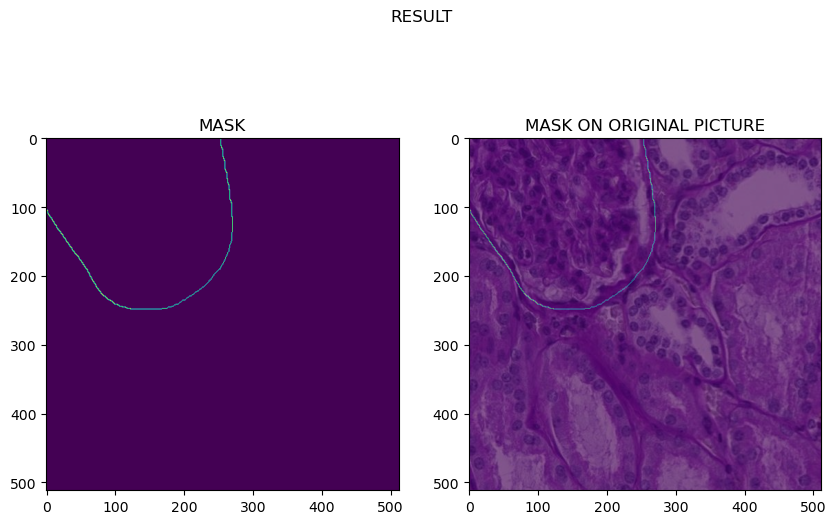

In [10]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
plt.suptitle('RESULT', x=0.5, y=0.8)

ax[0].set_title('MASK', fontsize=12)
ax[1].set_title('MASK ON ORIGINAL PICTURE', fontsize=12)

ax[0].imshow(a)

I = plt.imread(f"{data_directory}/train/0006ff2aa7cd.tif")
ax[1].imshow(I)
ax[1].imshow(a, alpha=0.6)

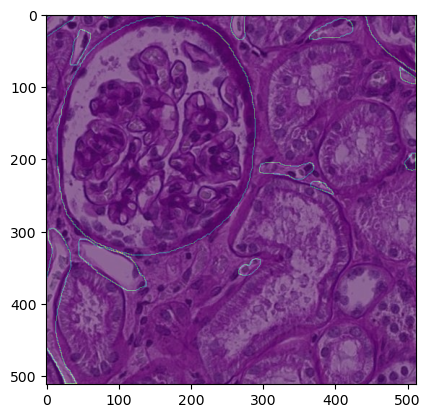

In [11]:
l = []
for i in range(len(result["00da8fdf2391"])):
    arr = result["00da8fdf2391"][i]["coordinates"]
    bitmap = to_bitmap(arr)
    # print(bitmap.shape)
    l.append(bitmap)

l = np.array(l)
# print(l.shape)
arr = np.sum(l, axis=0)
# print(arr.shape)

I = plt.imread(f"{data_directory}/train/00da8fdf2391.tif")
plt.imshow(I)
plt.imshow(arr, alpha=0.5)

plt.show() 

**tile_meta.csv** - Metadata for each image. The hidden version of this file also contains metadata for the test set tiles.
* source_wsi Identifies the WSI this tile was extracted from.
* {i|j} The location of the upper-left corner within the WSI where the tile was extracted.
* dataset The dataset this tile belongs to, as described above.

In [12]:
tile_meta = pd.read_csv(f"{data_directory}/tile_meta.csv")
tile_meta

,id,source_wsi,dataset,i,j
0,0006ff2aa7cd,2,2,16896,16420
1,000e79e206b7,6,3,10240,29184
2,00168d1b7522,2,2,14848,14884
3,00176a88fdb0,7,3,14848,25088
4,0033bbc76b6b,1,1,10240,43008
...,...,...,...,...,...
7028,ffd37b5c6598,13,3,13824,21504
7029,ffd3d193c71e,3,2,7680,16896
7030,ffd77e2517af,13,3,15872,28160
7031,ffe3cbb81f72,10,3,15456,23000


**wsi_meta.csv** - Metadata for the Whole Slide Images the tiles were extracted from.
* source_wsi Identifies the WSI.
* age, sex, race, height, weight, and bmi demographic information about the tissue donor.

In [13]:
pd.read_csv(f"{data_directory}/wsi_meta.csv")

,source_wsi,age,sex,race,height,weight,bmi
0,1,58,F,W,160.0,59.0,23.0
1,2,56,F,W,175.2,139.6,45.5
2,3,73,F,W,162.3,87.5,33.2
3,4,53,M,B,166.0,73.0,26.5


# Data analysis

### Visualize the given image and its 8 surrounding images

printed image is 62ab05f3b454
image with given position 12288, 21504 and wsi 7 not found
image with given position 12800, 21504 and wsi 7 not found
image with given position 12800, 22528 and wsi 7 not found
image with given position 13312, 21504 and wsi 7 not found
image with given position 13312, 22016 and wsi 7 not found


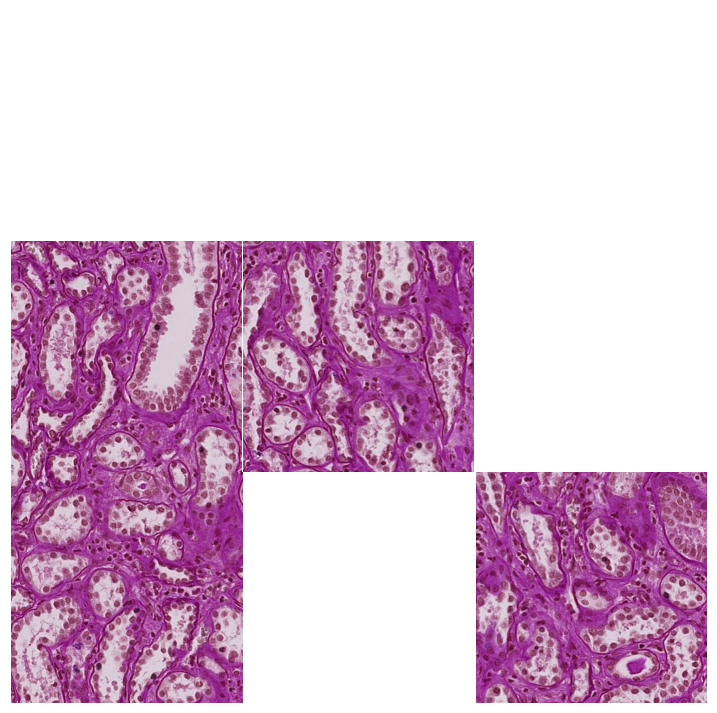

In [14]:
def visualize_surrounding_images(img_id: str) -> None:
    # Get the central image
    img = tile_meta.loc[tile_meta["id"] == img_id]
    img_i, img_j = img["i"].values[0], img["j"].values[0]
    img_wsi = img["source_wsi"].values[0]

    # position of the first image
    x, y = img_i - 512, img_j - 512

    # image plot frame
    grid_size = 3
    fig, axs = plt.subplots(grid_size, grid_size, figsize=(9, 9))

    # iterate over the grid
    for i in range(grid_size):
        for j in range(grid_size):
            axs[j, i].axis('off')
            x_, y_ = x + i * 512, y + j * 512
            try:
                current_img = tile_meta.loc[(tile_meta["i"] == x_) & 
                                            (tile_meta["j"] == y_) & 
                                            (tile_meta["source_wsi"] == img_wsi)]["id"].values[0]
            except IndexError:
                print(f"image with given position {x_}, {y_} and wsi {img_wsi} not found")
                continue
            
            # display the image in the corresponding subplot
            img_file = f"{data_directory}/train/{current_img}.tif"
            try:
                image = plt.imread(img_file)
                axs[j, i].imshow(image)
            except FileNotFoundError:
                continue

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

# load images to a list
# https://stackoverflow.com/questions/7336096/python-glob-without-the-whole-path-only-the-filename
img_file = [os.path.basename(x) for x in glob.glob(f'{data_directory}/train/*.tif')]
img_filename = str(random.choice(img_file))[:-4]

print(f"printed image is {img_filename}")
visualize_surrounding_images(img_filename)

# some images do not have all surrounding images

### Grayscale conversion

In [15]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.144])

def convert_all_gray(parent_path='./', gray_dir_name='train_gray'):
    gray_path = os.path.join(parent_path, gray_dir_name)
    print(f"Converted pictures will be saved to '{gray_path}'")
    Path(gray_path).mkdir(exist_ok=True)

    tif_files = glob.glob(os.path.join(f'{data_directory}/train', '*.tif'))
    for file_path in tqdm(tif_files):
        gray_file_path = os.path.join(gray_path, os.path.basename(file_path))

        # if exists don't convert again
        if os.path.exists(gray_file_path):
            continue

        img = np.array(Image.open(file_path))
        img_gray = rgb2gray(img)

        Image.fromarray(img_gray).save(gray_file_path)

# convert_all_gray()

#gray_image_filename = glob.glob(f'{data_directory}/train_gray/*.tif')[0]
#print(f'Visualizing {gray_image_filename}')
#
#img = mpimg.imread(gray_image_filename)
#img_show = plt.imshow(img, cmap=plt.get_cmap('gray'))

### Testing if there is any image that has no annotation
The competition data comprises tiles extracted from five Whole Slide Images (WSI) split into two datasets. Tiles from Dataset 1 have annotations that have been expert reviewed. Dataset 2 comprises the remaining tiles from these same WSIs and contain sparse annotations that have not been expert reviewed.

- All of the test set tiles are from Dataset 1.
- Two of the WSIs make up the training set, two WSIs make up the public test set, and one WSI makes up the private test set.
- The training data includes Dataset 2 tiles from the public test WSI, but not from the private test WSI.
We also include, as Dataset 3, tiles extracted from an additional nine WSIs. These tiles have not been annotated. You may wish to apply semi- or self-supervised learning techniques on this data to support your predictions.

In [16]:
tif_files = glob.glob(os.path.join(f'{data_directory}/train', '*.tif'))
dic = {}
for file_path in tif_files:
    file_name = Path(file_path).name.split('.')[0]
    dataset_number = tile_meta.loc[tile_meta["id"] == file_name]['dataset'].item()
    dic[dataset_number] = dic.get(dataset_number, 0) + 1

sorted_dic = dict(sorted(dic.items(), key=lambda item: item[0]))
print(f'Number of tiles for each dataset for all train tiles\n{sorted_dic}')

Number of tiles for each dataset for all train tiles
{1: 422, 2: 1211, 3: 5400}


#### For all files:
Number of tiles for each dataset for all train tiles
{1: 422, 2: 1211, 3: 5400}

In [17]:
tif_files = glob.glob(os.path.join(f'{data_directory}/train', '*.tif'))
without_annotation = []
for file_path in tif_files:
    file_name = Path(file_path).name.split('.')[0]
    try:
        result[file_name]
    except:
        without_annotation.append(file_name)

print(f"{len(without_annotation)} images does not have annotations")

dic = {}
for tif_id in without_annotation:
    source_wsi = tile_meta.loc[tile_meta["id"] == tif_id]['source_wsi'].item()
    dic[source_wsi] = dic.get(source_wsi, 0) + 1

sorted_dic = dict(sorted(dic.items(), key=lambda item: item[0]))
pd.DataFrame(pd.Series(sorted_dic), columns=['Number of images without annotations'])

5400 images does not have annotations


,Number of images without annotations
6,600
7,600
8,600
9,600
10,600
11,600
12,600
13,600
14,600


#### Results from all files:
5400 images does not have annotations
{6: 600, 7: 600, 8: 600, 9: 600, 10: 600, 11: 600, 12: 600, 13: 600, 14: 600}

In [18]:
# !pip install opencv-python
# !apt-get update && apt-get install ffmpeg libsm6 libxext6  -y
%pip install opencv-python

import cv2

def create_mask_for_image(image):
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower_hsv = np.array([0,0,250])
    upper_hsv = np.array([250,255,255])
    
    mask = cv2.inRange(image_hsv, lower_hsv, upper_hsv)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11,11))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    return mask

#image  deskew function
def  deskew_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255

#image  gray  function
def  gray_image(image):
    mask = create_mask_for_image(image)
    output = cv2.cvtColor(image,  cv2.COLOR_BGR2GRAY)
    return output/255

#image  thresh  function
def  thresh_image(image):
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    output = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV) #+cv.THRESH_OTSU)
    return output


#image  rnoise  function
def  rnoise_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255

#image  dilate  function
def  dilate_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255


#image  erode  function
def  erode_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255


#image  opening  function
def  opening_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255

#image canny function
def  canny_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255


#image segmentation function
def segment_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255


#sharpen the image
def sharpen_image(image):
    image_blurred = cv2.GaussianBlur(image, (0, 0), 3)
    image_sharp = cv2.addWeighted(image, 1.5, image_blurred, -0.5, 0)
    return image_sharp

l = []
for i in range(len(result["00da8fdf2391"])):
    arr = result["00da8fdf2391"][i]["coordinates"]
    bitmap = to_bitmap(arr)
    # print(bitmap.shape)
    l.append(bitmap)

l = np.array(l)
#print(l.shape)
arr = np.sum(l, axis=0)
#print(arr.shape)

img = cv2.imread('data/train/00da8fdf2391.tif')

Note: you may need to restart the kernel to use updated packages.


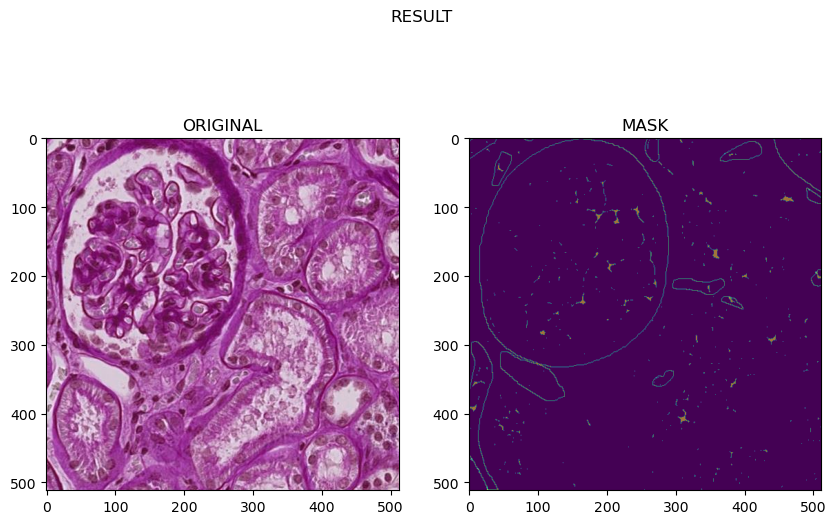

In [19]:

#mask
image_mask = create_mask_for_image(img)

fig, ax = plt.subplots(1, 2, figsize=(10, 10))
plt.suptitle('RESULT', x=0.5, y=0.8)
#plt.tight_layout(1)

ax[0].set_title('ORIGINAL', fontsize=12)
ax[1].set_title('MASK', fontsize=12)

ax[0].imshow(img/255)
ax[1].imshow(image_mask)
ax[1].imshow(arr, alpha=0.5);

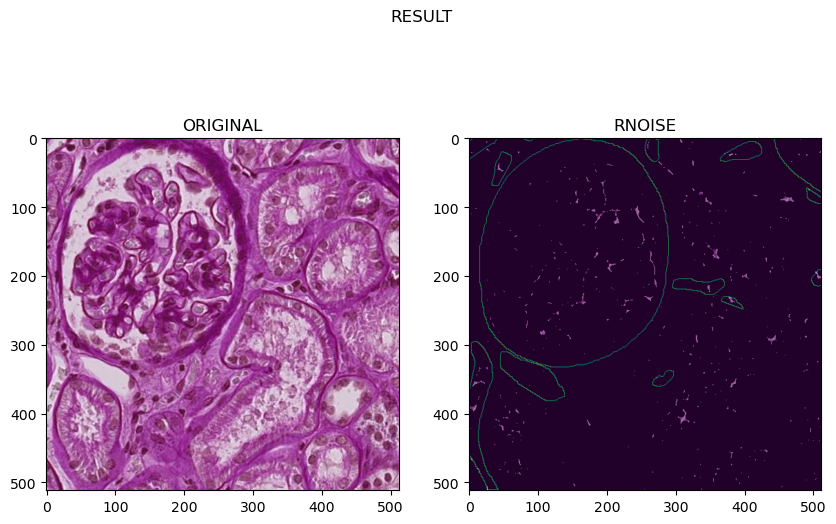

In [20]:
#rnoise
image_rnoise = rnoise_image(img)

fig, ax = plt.subplots(1, 2, figsize=(10, 10))
plt.suptitle('RESULT', x=0.5, y=0.8)

ax[0].set_title('ORIGINAL', fontsize=12)
ax[1].set_title('RNOISE', fontsize=12)

ax[0].imshow(img/255)
ax[1].imshow(image_rnoise)
ax[1].imshow(arr, alpha=0.5);

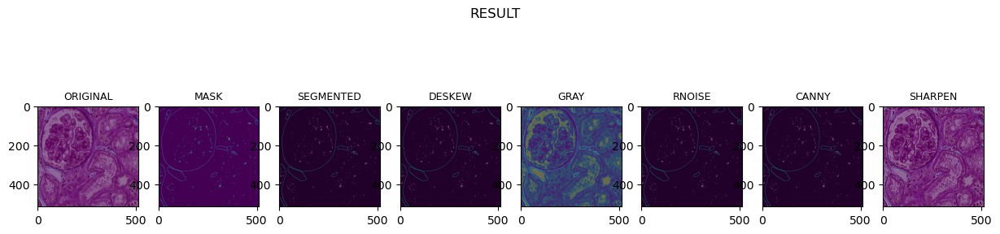

In [21]:
image_mask = create_mask_for_image(img)

#segmentation
image_segmented = segment_image(img)

#deskew
image_deskew = deskew_image(img)

#gray
image_gray = gray_image(img)

#rnoise
image_rnoise = rnoise_image(img)

#canny
image_canny = canny_image(img)

#sharpen the image
image_sharpen = sharpen_image(img)

fig, ax = plt.subplots(1, 8, figsize=(15, 6))
plt.suptitle('RESULT', x=0.5, y=0.8)

ax[0].set_title('ORIGINAL', fontsize=9)
ax[1].set_title('MASK', fontsize=9)
ax[2].set_title('SEGMENTED', fontsize=9)
ax[3].set_title('DESKEW', fontsize=9)
ax[4].set_title('GRAY', fontsize=9)
ax[5].set_title('RNOISE', fontsize=9)
ax[6].set_title('CANNY', fontsize=9)
ax[7].set_title('SHARPEN', fontsize=9)

ax[0].imshow(img/255)
ax[1].imshow(image_mask)
ax[2].imshow(image_segmented)
ax[3].imshow(image_deskew)
ax[4].imshow(image_gray )
ax[5].imshow(image_rnoise)
ax[6].imshow(image_canny)
ax[7].imshow(image_sharpen)

ax[0].imshow(arr, alpha=0.5)
ax[1].imshow(arr, alpha=0.5)
ax[2].imshow(arr, alpha=0.5)
ax[3].imshow(arr, alpha=0.5)
ax[4].imshow(arr, alpha=0.5)
ax[5].imshow(arr, alpha=0.5)
ax[6].imshow(arr, alpha=0.5)
ax[7].imshow(arr, alpha=0.5);


**It looks like only grayscale can be used.**

# Nápady
*   4 třídy pro kazdy pixel (nic, unsure, g...., blood_vessel)
*   0-100,100-200,200-300 třídy. skoro regresní uloha
*   (100, 512,512)

* oddělení mask přes BBOX ?
### Models
*   UNET
*   RCNN

### Todo
### Vizualizace
*   id obrazku -> zobrazeni obrazku + okolnich
*   

## Dataset & Dataloader

In [22]:
class StructureValue(IntEnum):

    BLOOD_VESSEL = 1
    GLOMERULUS = 2
    #BOTH = 3
    UNSURE = 4

    
    @staticmethod
    def get_value(type):
        if type == 'blood_vessel':
            return StructureValue.BLOOD_VESSEL
        elif type == 'glomerulus':
            return StructureValue.GLOMERULUS
        else:
            return StructureValue.UNSURE


class TifImageDataset(Dataset):
    def __init__(self, img_dir, annotation_file, add_rotated=False, only_annotated = True, count=-1):
        self.add_rotated = add_rotated

        self.img_dir = img_dir
        self.tif_files = [f for f in os.listdir(img_dir)] # Loading file names 
        self.tif_files = np.array(self.tif_files)

        # custom dataset size
        if count == -1:
            count = len(self.tif_files)
        else:
            if add_rotated:
                count //= 4
            count = min(count, len(self.tif_files))  # ceiling value
        
        # load polygons.jsonl file
        with open(f"{data_directory}/polygons.jsonl",'r') as json_file:
            json_list = list(json_file)
        
        # convert lines to dictionary
        result = {}
        for json_str in json_list:
            obj = json.loads(json_str)
            result[obj["id"]] = obj["annotations"]

        # use only annotated files
        before = len(self.tif_files)
        self.tif_files = [f for f in self.tif_files if f.split(".")[0] in list(result.keys())]
        after = len(self.tif_files)
        print(f"Annotated: {after}, Not Anotated: {before - after}")
        
        self.annotations = result
        self.tif_files = self.tif_files[:count]

        # Rotating images
        if add_rotated:
            rotated = self.tif_files
            for rotation in ('90', '180', '270'):
                rotated = np.append(rotated, ([file + '.' + rotation for file in self.tif_files]))
            self.tif_files = rotated

        print(f"Total images: {len(self.tif_files)}")

        
    def __len__(self):
        return len(self.tif_files)

    """
    Converts array of coordinates to 512x512 bitmap (contains 1 if coordinate is present 0 otherwise)
        coordinates (2d array): x, y coordinates
    Returns:
        type: Description of the return value.
    """
    def to_bitmap(self, coordinates):
        res = np.zeros([512, 512], dtype=np.float32)
        for region_coordinates in coordinates:
            region_coordinates = [[y,x] for [x,y] in region_coordinates] # flip (format issue)
            region_mask = ski.draw.polygon2mask((512, 512), region_coordinates)
            res += region_mask
            # for (y, x) in region_coordinates:
            #    res[y, x] = 1
        return res

    def __getitem__(self, idx):
        return self.getitem_and_id(idx)[:2] # first two items
    
    def getitem_and_id(self, idx):
        image_name = self.tif_files[idx]

        # get part after '.tif'
        str_to_found = '.tif'
        index = image_name.index(str_to_found) + len(str_to_found)
        part_after = image_name[index: ]

        image_name = image_name[:index]
        #print(image_name)
        rotate_times = (int(part_after[1:]) / 90) % 4 if part_after else 0
        #if rotate_times:
        #    print('rotatiiiiiiiiiiiiiiiing', rotate_times)

        image = np.rot90(plt.imread(os.path.join(self.img_dir, image_name)).astype(np.float32), rotate_times)
        
        # looking for mask
        mask = np.zeros([512, 512], dtype=np.float32)
        image_uid = image_name.split('.')[0]
        if image_uid in self.annotations:
            for annotation in self.annotations[image_uid]:
                type_value = StructureValue.get_value(annotation['type'])
                if type_value == StructureValue.BLOOD_VESSEL:
                    mask += self.to_bitmap(annotation['coordinates'])


        mask = np.clip(mask, 0, 1)
        mask = np.rot90(mask, rotate_times)
            
        # Unify format
        image = image/255

        image = image.reshape(3, 512,512)
        mask = mask.reshape(1, 512, 512)

        image = torch.from_numpy(image.copy()).float().to(device)
        mask = torch.from_numpy(mask.copy()).float().to(device)
        #image.requires_grad = True
        #mask.requires_grad = True

        return image, mask, image_name


"""dataset = TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', add_rotated=False)

ind = 3
img  = dataset.__getitem__(ind)[0].reshape(512,512,3)
mask = dataset.__getitem__(ind)[1].reshape(512,512,1)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(5, 3))
axes[0].imshow(img.numpy())
axes[1].imshow(mask.numpy(), cmap="gray")
plt.show()"""


'dataset = TifImageDataset(f\'{data_directory}/train/\', f\'{data_directory}/polygons.jsonl\', add_rotated=False)\n\nind = 3\nimg  = dataset.__getitem__(ind)[0].reshape(512,512,3)\nmask = dataset.__getitem__(ind)[1].reshape(512,512,1)\nfig, axes = plt.subplots(nrows=1, ncols=2, figsize=(5, 3))\naxes[0].imshow(img.numpy())\naxes[1].imshow(mask.numpy(), cmap="gray")\nplt.show()'

## Spliting datasets to training and validation dataset

In [23]:
dataset = TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', add_rotated=True)
print(len(dataset))
gen1 = torch.Generator().manual_seed(36)

training_dataset, validation_dataset = torch.utils.data.random_split(dataset, [0.8, 0.2], gen1)

training_loader = torch.utils.data.DataLoader(training_dataset, batch_size=32, shuffle=True)
validation_loader = torch.utils.data.DataLoader(validation_dataset, batch_size=64, shuffle=False)

Annotated: 1633, Not Anotated: 5400
Total images: 6532
6532


1 blood_vessel
1 glomerulus
1 blood_vessel
1 blood_vessel
1 blood_vessel
1 blood_vessel
1 blood_vessel
1 blood_vessel
1 blood_vessel
1 blood_vessel
1 blood_vessel
1 blood_vessel
1 glomerulus
1 blood_vessel


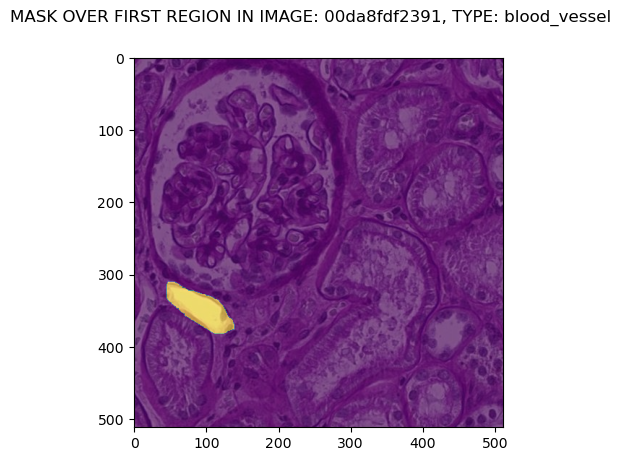

In [24]:
image_shape = (512, 512)
image_to_display = "00da8fdf2391"

for t in result[image_to_display]:
    print(len(t['coordinates']), t['type'])

reg_num = 4
regions = result[image_to_display][reg_num]["coordinates"]
types = result[image_to_display][reg_num]["type"]
region = regions[0]

region = [[y,x] for [x,y] in region] # flip (format issue)
region_mask = ski.draw.polygon2mask(image_shape, region)

plt.suptitle(f'MASK OVER FIRST REGION IN IMAGE: {image_to_display}, TYPE: {types}')
I = plt.imread(f"{data_directory}/train/{image_to_display}.tif")
plt.imshow(I)
plt.imshow(region_mask, alpha=.6);

## IoU (Intersection of Union)

In [25]:
def calculate_iou(mask1, mask2):
    # Convert masks to numpy arrays if they are not already
    mask1 = np.asarray(mask1)
    mask2 = np.asarray(mask2)

    # Ensure masks have the same shape
    if mask1.shape != mask2.shape:
        raise ValueError("Masks must have the same shape.")

    # Calculate intersection and union
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()

    # Handle the case where both masks are empty
    iou = 1.0 if union == 0 else intersection / union

    return iou

## Neural network

In [26]:
class UNet(nn.Module):
    def __init__(self, device="cpu"):
        super(UNet, self).__init__()
        self.conv = nn.Conv2d(in_channels=3, out_channels=1, kernel_size=1, dtype=torch.float32)
        self.sigmoid = nn.Sigmoid()
        self.device=device

    def forward(self, x):
        x = self.conv(x)
        x = self.sigmoid(x)
        return x

    def predict(self, x):
        with torch.no_grad():
            y_pred = self.forward(x)
        return (y_pred > 0.5) * 1.0

with torch.no_grad():
    model = UNet()
    model.to(device)
    input = torch.randn(1, 3, 512, 512).to(device)
    output = model(input)
    print(input.shape, output.shape)

torch.Size([1, 3, 512, 512]) torch.Size([1, 1, 512, 512])


In [27]:
def train_one_epoch(model, loss_function, optimizer, training_loader, batch_stop = 999999, verbose_interval = -1, verbose = True, show_graph = False):
    if verbose_interval == -1: # set verbose interval to be a nice number
        verbose_interval = len(training_loader) // 7
        verbose_interval = max(verbose_interval, 1)

    start = time.time()
    if verbose:
        print(f"Running {min(batch_stop, len(training_loader) )} batches")
    running_cum_loss = 0
    losses = []
    example_count = 0
    for i, data in enumerate(training_loader):
        inputs, labels = data
        example_count += len(labels) # batch size

        optimizer.zero_grad()

        outputs = model(inputs)
        
        #print(inputs.shape, labels.shape, outputs.shape, )
        #print(str(outputs)[:200])
        #print(str(labels)[:200])
        loss = loss_function(outputs, labels)
        loss.backward()
        
        optimizer.step() # Adjust learning weights
        #print(loss)
        #return 0

        #  report
        losses.append(loss.item())
        running_cum_loss += loss.item() * inputs.shape[0]
        if verbose == True:
            if i % verbose_interval == 0 or i == len(training_loader) - 1:
                elapsed = time.time() - start
                non_training_time = 2
                estimated_time = (len(training_loader) / (i+1))  * elapsed
                print(f"  batch {i+1} loss: {loss.item():.5f} | estimated_time: {(estimated_time + non_training_time)/60:.1f} min | elapsed: {elapsed/60:.1f} min")
            
        if i > batch_stop:
            break

    
    if show_graph:
        plt.plot(range(1,len(losses)+1),losses, '-')
        plt.title(f"Trained on {example_count} Images: ")
        plt.ylabel("Loss")
        plt.xlabel("Batch Number")
        plt.show()
    # returns avg loss
    return running_cum_loss / example_count


torch.manual_seed(1)

simple_model = UNet().to(device)
loss_function = nn.BCEWithLogitsLoss() 
optimizer = optim.Adam(simple_model.parameters(), lr=0.001)

training_dataset = TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', count=300, add_rotated=False)

training_loader = DataLoader(training_dataset, batch_size=50, shuffle=True) 

#average_loss = train_one_epoch(simple_model, loss_function, optimizer, training_loader, batch_stop=200, verbose=True, show_graph=True)

Annotated: 1633, Not Anotated: 5400
Total images: 300


In [28]:
def get_validation_accuracy(mdl, loss_function, validation_loader):
    running_cum_vloss = 0.0
    vcorrect = 0
    for vdata in validation_loader:
        vinputs, vlabels = vdata
        with torch.no_grad(): # we don't need to alter the model
            voutputs = mdl(vinputs)
            vloss = loss_function(voutputs, vlabels)
        running_cum_vloss += vloss * vinputs.shape[0]
        # count the correctly classified samples
        vcorrect += (voutputs.argmax(1) == vlabels).float().sum()
    
    avg_vloss = running_cum_vloss / len(validation_dataset)
    print(vcorrect, len(validation_dataset))
    vacc = vcorrect / len(validation_dataset)
    return avg_vloss, vacc

def calculate_mAP(outputs, labels):
    num_classes = outputs.size(1)
    y_true = labels.cpu().numpy()
    y_scores = torch.softmax(outputs, dim=1).cpu().numpy()

    mAP = 0.0

    for class_idx in range(num_classes):
        y_true_class = (y_true == class_idx).astype(int)
        y_scores_class = y_scores[:, class_idx]

        # Compute the Average Precision for the current class
        ap = average_precision_score(y_true_class.flatten(), y_scores_class.flatten())
        mAP += ap

    mAP /= num_classes

    return mAP

def get_validation_accuracy(model, loss_function, validation_loader):
    model.eval()  # Set the model to evaluation mode

    total_vloss = 0.0
    total_mAP = 0.0
    correct_predictions = 0
    total_samples = 0

    with torch.no_grad():
        for inputs, labels in validation_loader:

            # Forward pass
            outputs = model(inputs)
            vloss = loss_function(outputs, labels)
            total_vloss += vloss.item()

            # Assuming you have a function called `calculate_mAP` to compute mAP
            mAP = calculate_mAP(outputs, labels)
            total_mAP += mAP

            # Calculate accuracy
            _, predicted = torch.max(outputs.data, 1)
            total_samples += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()

    # Calculate averages
    avg_vloss = total_vloss / len(validation_loader)
    avg_mAP = total_mAP / len(validation_loader)
    vacc = correct_predictions / total_samples

    return avg_vloss, avg_mAP, vacc


def do_epochs(mdl, loss_function, _optimizer, _training_loader, _validation_loader, epochs = 2, verbose = True):

    for epoch in range(epochs):
        print('EPOCH {}:'.format(epoch + 1))

        # One training step
        avg_loss = train_one_epoch(mdl, loss_function, _optimizer, _training_loader, verbose = verbose)

        # Validation performance
        avg_vloss, avg_mAP, vacc = get_validation_accuracy(mdl, loss_function, _validation_loader)
        
        # Display
        print(f"  TRAIN loss: {avg_loss:.3f}, VALIDATION loss: {avg_vloss:.3f}, accuracy: {vacc:.3f}, avg_mAP: {avg_mAP:.3f}")


simple_model = UNet().to(device)

loss_function = nn.BCEWithLogitsLoss() 
optimizer = optim.Adam(simple_model.parameters(), lr=0.001)

dataset = TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', count=100, add_rotated=True)
gen1 = torch.Generator().manual_seed(36)
training_dataset, validation_dataset = torch.utils.data.random_split(dataset, [0.78, 0.22], gen1)
train_loader = torch.utils.data.DataLoader(training_dataset, batch_size=32, shuffle=True)
validation_loader = torch.utils.data.DataLoader(validation_dataset, batch_size=64, shuffle=False)

#average_loss = do_epochs(simple_model, loss_function, optimizer, training_loader, validation_loader, epochs=4, verbose=False)


Annotated: 1633, Not Anotated: 5400
Total images: 100


## Pixel accuracy

although simple to implement it is a bad practice to use in image segmentation

In [29]:
def pixel_accuracy(model, dataloader, break_after = -1):

    if break_after == -1:
        break_after == dataloader.__len__()
    with torch.no_grad():
        model.eval()  # Set the model in evaluation mode

        total_correct = 0
        total_samples = 0

        for i, (inputs, labels) in enumerate(dataloader):
            if i > break_after:
                break 
            # Move data to the same device as the model (CPU or GPU)
            inputs = inputs.reshape(1, 3, 512, 512).to(device)
            labels = labels.reshape(1, 1, 512, 512).to(device)

            # Make predictions on the batch
            predictions = model.predict(inputs)

            # Convert predictions and labels to numpy arrays for easier comparison
            predictions = predictions.cpu().numpy().flatten()
            labels = labels.cpu().numpy().flatten()

            # Count the correct predictions in the batch
            total_correct += (predictions == labels).sum().item()
            total_samples += len(labels)

        # Calculate the accuracy
        accuracy = total_correct / total_samples

        model.train()  # Set the model back to training mode

    return accuracy

pixel_accuracy(simple_model, training_dataset, break_after=50)

0.23972896501129748

# Help function
Getting pred x label | train x label data in separate lists

In [30]:
def get_preds_and_labels(model, dataset: Dataset, count: int) -> List[Tuple[np.array, np.array]]:
    preds = []
    labels = []
    for i, (train_mask, label) in enumerate(dataset):
        if not i < count:
            break
        train_mask = train_mask.reshape(1, 3, 512, 512).to(device)
        preds.append(model.predict(train_mask).cpu().numpy())
        labels.append(label.cpu().numpy())
    return preds, labels

def get_train_and_labels(model, dataset: Dataset, count: int) -> List[Tuple[np.array, np.array]]:
    train = []
    labels = []
    for i, (train_mask, label) in enumerate(dataset):
        if not i < count:
            break
        train_mask = train_mask.reshape(1, 3, 512, 512)
        train.append((train_mask).cpu().numpy())
        labels.append(label.cpu().numpy())
    return train, labels

def get_train_and_labels_and_preds(model, dataset: Dataset, count: int, index: int = 0) -> List[Tuple[np.array, np.array]]:
    if index + count > len(dataset):
        raise Exception("index + count bigger than len(dataset)")
    train = []
    labels = []
    preds = []
    ids = []
    for i in range(index, index + count):
        train_mask, label, id = dataset.getitem_and_id(i)
        train_mask = train_mask.reshape(1, 3, 512, 512)
        train.append((train_mask).cpu().numpy())
        preds.append(model.predict(train_mask).cpu().numpy())
        labels.append(label.cpu().numpy())
        ids.append(id)
    return train, labels, preds, ids

something_missing_= get_train_and_labels_and_preds( # something missing
    simple_model, 
    TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', add_rotated=False),
    count=3)

Annotated: 1633, Not Anotated: 5400
Total images: 1633


## mAP (Mean Average Precision)

In [31]:
from sklearn.metrics import precision_recall_curve, auc

import numpy as np
from sklearn.metrics import precision_recall_curve, auc

def calculate_iou(mask1, mask2):
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    if union == 0:
        iou = 1.0
    else:
        iou = intersection / union
    return iou

def calculate_ap(precision, recall):
    return auc(recall, precision)

# probably wrong, its literally mean
def calculate_mAP_FAKE(model, dataset, threshold=0.5, max_iter = 10):
    preds, labels = get_preds_and_labels(model, dataset, max_iter)
    n = len(preds)
    if n == 0:
        return 0.0

    sum = 0
    for pred, label in zip(preds, labels):
        sum += calculate_iou(pred, label)
    return sum / n



mAP = calculate_mAP_FAKE(simple_model, training_dataset, max_iter=10)
print("mAP:", mAP)


mAP: 0.035590920600145834


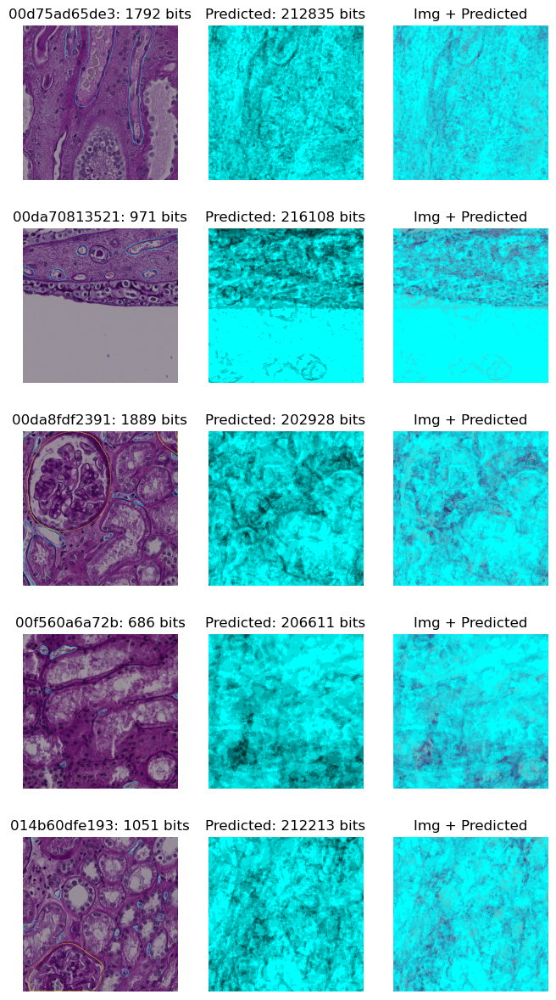

In [32]:
def overlay_image_with_bitmap(image, bitmap, color, mask_opacity_threshold = 0.3):
    image = image.reshape(512,512,3)
    bitmap = bitmap.reshape(512, 512)
    # Create a mask from the binary bitmap (convert it to a 3-channel mask)
    mask = np.stack([bitmap, bitmap, bitmap], axis=-1)

    # Set the color for the areas where the mask is one
    mask *= np.array(color).reshape(1, 1, 3) 

    bitmap_max = max(mask_opacity_threshold, bitmap.max()) # if mask is opaque

    # Blend the original image and the colored mask
    overlaid_image = image.copy()
    overlaid_image[bitmap == bitmap_max] = mask[bitmap == bitmap_max]

    return overlaid_image

def get_bounding_image(id, image_opacity=0.6):
    img = plt.imread(f"{data_directory}/train/{id}")
    blood_vessels = np.zeros([512, 512])
    glomeruluses = np.zeros([512, 512])
    unsures = np.zeros([512, 512])
    for annotations in result[id.split(".")[0]]:
        if annotations["type"] == "blood_vessel":
            blood_vessels += to_bitmap(annotations["coordinates"])
        elif annotations["type"] == "glomerulus":
            glomeruluses += to_bitmap(annotations["coordinates"])
        elif annotations["type"] == "unsure":
            unsures += to_bitmap(annotations["coordinates"])
    
    img = np.array(img * image_opacity) / 255 

    img = overlay_image_with_bitmap(img, blood_vessels, (0, 1, 1))
    img = overlay_image_with_bitmap(img, glomeruluses, (1, 1, 0))
    img = overlay_image_with_bitmap(img, unsures, (1, 0, 1))

    return img, blood_vessels

def get_predicted_image(model, id, pred_color, image_opacity=0.6, pred_opacity=1):
    img = plt.imread(f"{data_directory}/train/{id}")
    img = img.reshape(1,3,512,512).copy()
    img = np.array(img) / 255 
    output = model.predict(torch.from_numpy(img.copy()).float().to(device))

    output = output.squeeze()

    # torch tensor to numpy array
    opaque_mask=output.cpu().numpy() 
    mask = opaque_mask * pred_opacity


    img = img.reshape(512,512, 3) * image_opacity
    img = overlay_image_with_bitmap(img, mask, pred_color)

    return img, opaque_mask

def grayscale_to_rgb(mask, color):
    mask = mask.reshape(512, 512, 1)
    color=np.array(color)
    color = color.reshape(1, 1, 3)
    res = np.stack([mask*0, mask, mask], axis=-1)
    res = res.reshape(512, 512, 3)
    return res

def label_vs_pred_bounding(model, count = 3, index = 0, pred_color = (0, 1, 1), image_opacity=.7, pred_opacity=1, zoom = 1):
    ids = result_ids[index: index + count]
    pred_color = np.array(pred_color).reshape(1, 1, 3)
    if isinstance(ids, str) :
        ids = [ids]

    fig, axes = plt.subplots(nrows=len(ids), ncols=3, figsize=(8 * zoom, 15*zoom))
    for i in range(len(ids)):
        bounding, b_mask = get_bounding_image(ids[i] + ".tif", image_opacity)
        predicted, p_mask = get_predicted_image(model, ids[i] + ".tif", pred_color, image_opacity, pred_opacity=pred_opacity)
        #print(bounding.max(), b_mask.max(), predicted.max(), p_mask.max())

        
        axes[i][0].set_title(f"{ids[i]}: {np.sum(b_mask):.0f} bits")
        axes[i][1].set_title(f"Predicted: {np.sum(p_mask):.0f} bits")
        axes[i][2].set_title(f"Img + Predicted")

        axes[i][0].imshow(bounding, vmin=0, vmax=1)
        axes[i][1].imshow(grayscale_to_rgb(p_mask, pred_color), vmin=0, vmax=1)
        axes[i][2].imshow(predicted, vmin=0, vmax=1)

        axes[i][0].axis('off')
        axes[i][1].axis('off')
        axes[i][2].axis('off')

    plt.show()

label_vs_pred_bounding(simple_model, count = 5, index = 10)

Annotated: 1633, Not Anotated: 5400
Total images: 1633


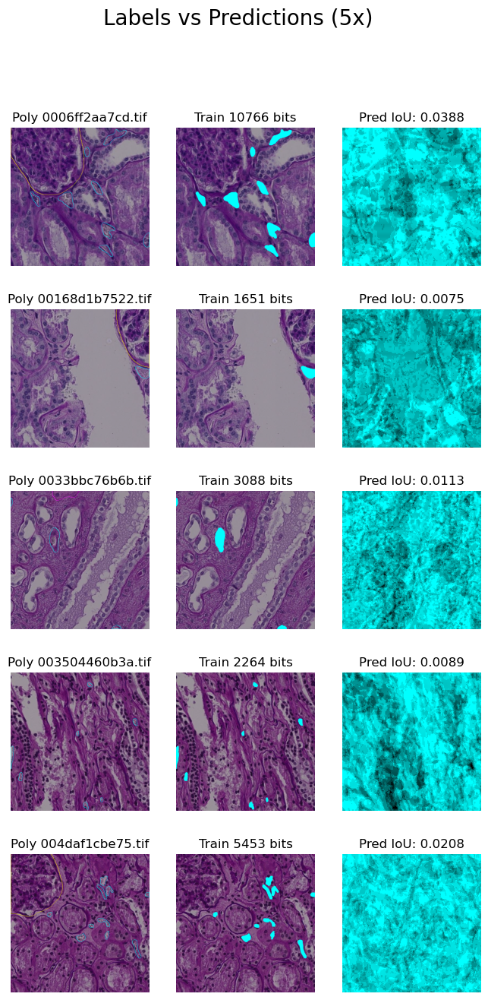

In [33]:
# tady to leovi pada
def get_predicted_mask(model, train_image):
    tensor = torch.from_numpy(train_image.reshape(1,3,512,512).copy()).float().to(device)
    output = model.predict(tensor)
    output = output.squeeze().cpu().numpy()
    return output
    


def label_vs_pred(model, dataset, count = 3, index = 0, pred_color = (0, 1, 1), background_opacity=.7, zoom=1):
    train_images, labels, preds, ids = get_train_and_labels_and_preds(model, dataset, count = count, index = index)
    fig, axes = plt.subplots(nrows=len(labels), ncols=3, figsize=(8*zoom, 15*zoom))
        
    for i, (train_image, label, pred, id) in enumerate(zip(train_images, labels, preds, ids)):
        pred = get_predicted_mask(model, train_image.reshape(1,3,512,512))
        
        train_image = np.array(train_image * background_opacity)

        label_image = overlay_image_with_bitmap(train_image, label, (0, 1, 1))
        prediction_image = overlay_image_with_bitmap(train_image, pred, (0, 1, 1))
        bounding_image, _ = get_bounding_image(id, background_opacity)

        bounding_image = np.clip(bounding_image, 0, 1)

        iou = calculate_iou(label, pred)

        #print(np.unique(pred))
        #print(train_image.max(), label.max(), pred.max(), label_image.max(), "---", train_image.min(), label.min(), pred.min(), label_image.min())

        axes[i][0].set_title(f"Poly {id}")
        axes[i][1].set_title(f"Train {np.sum(label):.0f} bits")
        axes[i][2].set_title(f"Pred IoU: {iou:.4f}")

        axes[i][0].imshow(bounding_image.reshape(512, 512, 3), vmin=0, vmax=1)
        axes[i][1].imshow(label_image.reshape(512, 512, 3), vmin=0, vmax=1)
        axes[i][2].imshow(grayscale_to_rgb(pred, pred_color), vmin=0, vmax=1)

        axes[i][0].axis('off')
        axes[i][1].axis('off')
        axes[i][2].axis('off')

    fig.suptitle(f"Labels vs Predictions ({count}x)", fontsize=20)
    plt.show()
index = 5
label_vs_pred(
    simple_model, 
    TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', add_rotated=False),
    count=5, index = 0
    )
# tady to leovi pada

In [34]:
import torch
import torch.nn as nn

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class UNetComplex(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, device="cpu"):
        super(UNetComplex, self).__init__()
        # Downsampling
        self.down1 = DoubleConv(in_channels, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)
        # Upsampling
        self.up1 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = nn.ConvTranspose2d(256 + 256, 128, kernel_size=2, stride=2)
        self.up3 = nn.ConvTranspose2d(128 + 128, 64, kernel_size=2, stride=2)
        self.up4 = nn.ConvTranspose2d(64 + 64, out_channels, kernel_size=1, stride=1)
        self.sigmoid = nn.Sigmoid()

        self.device = device

    def forward(self, x):
        # Downsample path
        x1 = self.down1(x)
        x2 = self.down2(nn.MaxPool2d(2)(x1))
        x3 = self.down3(nn.MaxPool2d(2)(x2))
        x4 = self.down4(nn.MaxPool2d(2)(x3))
        
        # Upsample path with skip connections
        x = self.up1(x4)
        x = torch.cat([x, x3], dim=1)
        x = self.up2(x)
        x = torch.cat([x, x2], dim=1)
        x = self.up3(x)
        x = torch.cat([x, x1], dim=1)
        x = self.up4(x)
        
        # Apply sigmoid activation
        x = self.sigmoid(x)
        
        return x
    def predict(self, x):
        with torch.no_grad():
            y_pred = self.forward(x)
        return (y_pred > 0.5) * 1.0

# Test the model with example input
model = UNetComplex(in_channels=3, out_channels=1)
input_example = torch.randn(1, 3, 512, 512)
output_example = model(input_example)
print("Output shape:", output_example.shape) 

Output shape: torch.Size([1, 1, 512, 512])


Annotated: 1633, Not Anotated: 5400
Total images: 100
Running 25 batches
  batch 1 loss: 0.91199 | estimated_time: 14.3 min | elapsed: 0.6 min
  batch 4 loss: 0.89525 | estimated_time: 8.0 min | elapsed: 1.3 min
  batch 7 loss: 0.96755 | estimated_time: 6.7 min | elapsed: 1.9 min
  batch 10 loss: 0.83511 | estimated_time: 6.2 min | elapsed: 2.5 min
  batch 13 loss: 0.97438 | estimated_time: 6.0 min | elapsed: 3.1 min
  batch 16 loss: 0.96901 | estimated_time: 6.0 min | elapsed: 3.8 min
  batch 19 loss: 0.94040 | estimated_time: 5.8 min | elapsed: 4.4 min
  batch 22 loss: 0.96438 | estimated_time: 5.7 min | elapsed: 5.0 min
  batch 25 loss: 0.93324 | estimated_time: 5.7 min | elapsed: 5.7 min


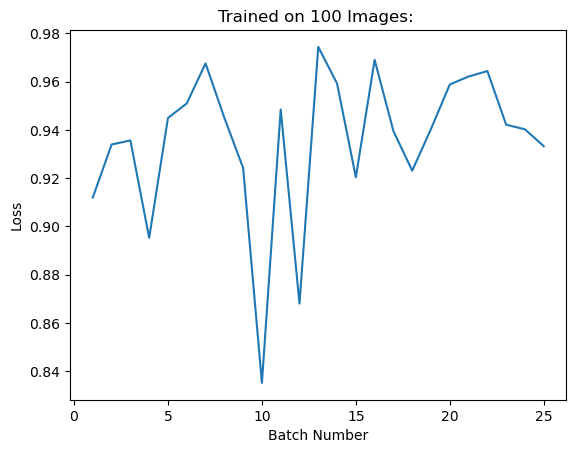

In [35]:
torch.manual_seed(1)
gpt_model = UNetComplex().to(device)
#loss_function = nn.BCEWithLogitsLoss() 
loss_function = losses.DiceLoss(losses.BINARY_MODE)
optimizer = optim.Adam(gpt_model.parameters(), lr=0.000001) 

training_dataset = TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', count=100, add_rotated=True)

training_loader = DataLoader(training_dataset, batch_size=4, shuffle=True) 


average_loss = train_one_epoch(gpt_model, loss_function, optimizer, training_loader, verbose=True, batch_stop=99999999, show_graph=True) 

In [36]:
#calculate_mAP_FAKE(gpt_model, training_dataset, max_iter=10)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


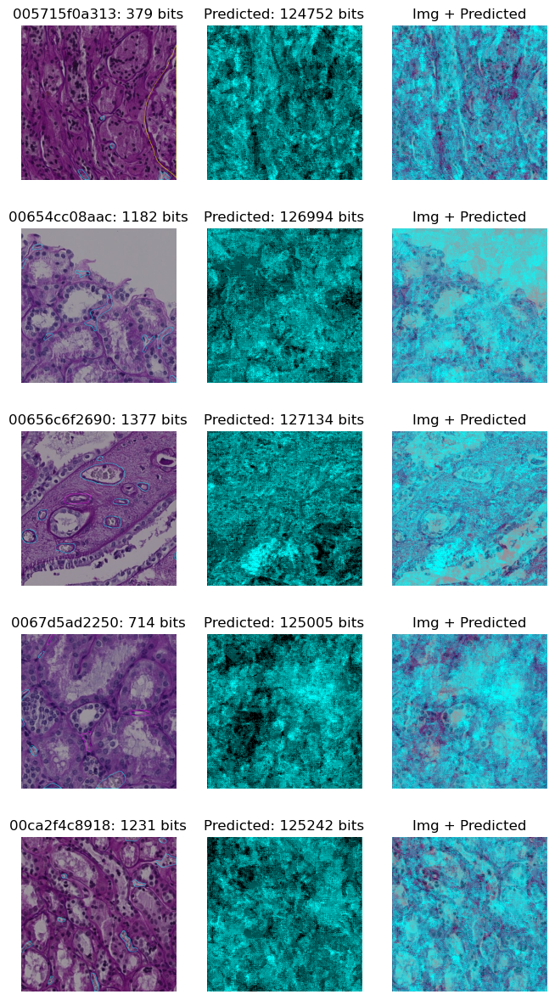

In [37]:
label_vs_pred_bounding(gpt_model, zoom=1, index=5, count = 5)


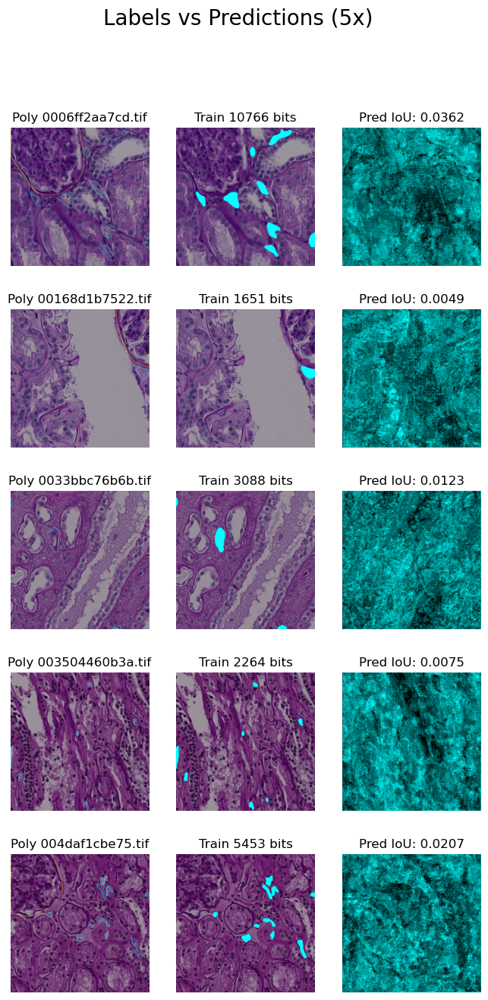

In [38]:
# training_dataset.getitem_and_id(1)
label_vs_pred(gpt_model, training_dataset, count = 5, index=0)

In [39]:
pixel_accuracy(gpt_model, training_dataset, break_after=10)

0.37143811312588776

## Module: `segmentation_models_pytorch` 

In [40]:
#!pip install segmentation-models-pytorch
#!pip install torch torchvision

In [41]:
import segmentation_models_pytorch as smp
import torch
import torch.nn as nn

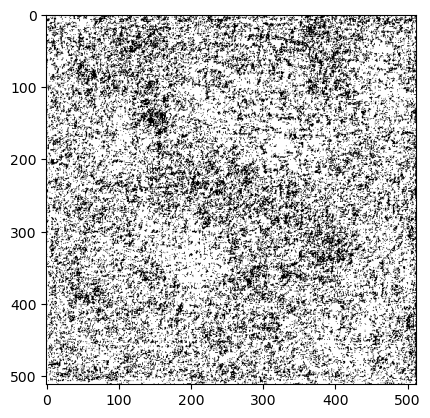

In [42]:
class UNetInstanceSegmentation(nn.Module):
    def __init__(self, num_classes=1, num_channels=3):
        super(UNetInstanceSegmentation, self).__init__()
        self.model = smp.Unet(
            encoder_name="resnet34",  # You can choose different encoder backbones if desired.
            encoder_weights="imagenet",
            in_channels=num_channels,
            classes=num_classes,
            activation='sigmoid'
        )

    def forward(self, x):
        return self.model(x)

    def predict(self, x):
        with torch.no_grad():
            y_pred = self.forward(x)
        return (y_pred > 0.5) * 1.0

model = UNetInstanceSegmentation()
model.to(device)

inp = torch.randn(1, 3, 512, 512).to(device)
output_mask = model.predict(inp)

plt.imshow(output_mask.cpu().numpy().reshape(512, 512, 1), cmap="gray");

In [43]:
from segmentation_models_pytorch.encoders import get_preprocessing_fn
preprocess_input = get_preprocessing_fn('resnet34', pretrained='imagenet')
preprocess_input(torch.randn(512, 512, 3).numpy())

array([[[-2.11501246, -2.01065511, -1.79161404],
        [-2.10568216, -2.02445479, -1.83775962],
        [-2.07806097, -2.0235482 , -1.80718989],
        ...,
        [-2.09681996, -2.04873978, -1.8128515 ],
        [-2.15564725, -2.04871274, -1.81000485],
        [-2.15206734, -2.0363623 , -1.81725866]],

       [[-2.09394836, -2.03853662, -1.79371952],
        [-2.09416764, -2.04737843, -1.80180034],
        [-2.11395886, -2.05411192, -1.7781226 ],
        ...,
        [-2.11161095, -2.03050843, -1.78380839],
        [-2.11307926, -2.02711939, -1.82372319],
        [-2.12002981, -2.02066688, -1.78376777]],

       [[-2.14153228, -2.0092392 , -1.76867529],
        [-2.12458113, -2.06217487, -1.79674886],
        [-2.10801261, -2.06653413, -1.79388142],
        ...,
        [-2.11920275, -2.03206032, -1.81133345],
        [-2.12265061, -2.0829604 , -1.8213754 ],
        [-2.12013194, -2.05940009, -1.78678659]],

       ...,

       [[-2.12268347, -2.03252875, -1.78913258],
        [-2

Annotated: 1633, Not Anotated: 5400
Total images: 2
Running 1 batches
  batch 1 loss: 0.95492 | estimated_time: 0.0 min | elapsed: 0.0 min


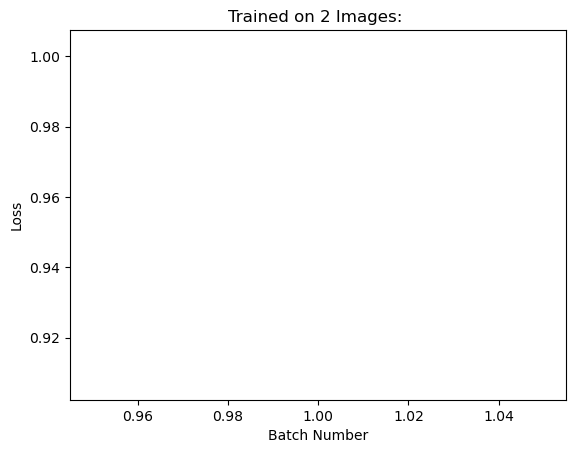

In [44]:
torch.cuda.empty_cache()
iseg_model = UNetInstanceSegmentation()

iseg_model.to(device)
loss_function = losses.DiceLoss(losses.BINARY_MODE)

optimizer = optim.Adam(iseg_model.parameters(), lr=0.00008)

training_dataset = TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', count=2, add_rotated=False)

training_loader = DataLoader(training_dataset, batch_size=6, shuffle=True) 

average_loss = train_one_epoch(iseg_model, loss_function, optimizer, training_loader, batch_stop=5000, verbose=True, show_graph=True)

In [45]:
from segmentation_models_pytorch import train
# Set flag to train the model or not. If set to 'False', only prediction is performed (using an older model checkpoint)
TRAINING = True

# Set num of epochs
EPOCHS = 12

# Set device: `cuda` or `cpu`
DEVICE = device

# define loss function
loss = smp.utils.losses.DiceLoss()

# define metrics
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.00008),
])

model = Instance

train_epoch = smp.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

ImportError: cannot import name 'train' from 'segmentation_models_pytorch' (d:\User\yannick\envs\hacking_the_human\lib\site-packages\segmentation_models_pytorch\__init__.py)

In [46]:
#calculate_mAP_FAKE(iseg_model, training_dataset, max_iter=10)

Annotated: 1633, Not Anotated: 5400
Total images: 1633


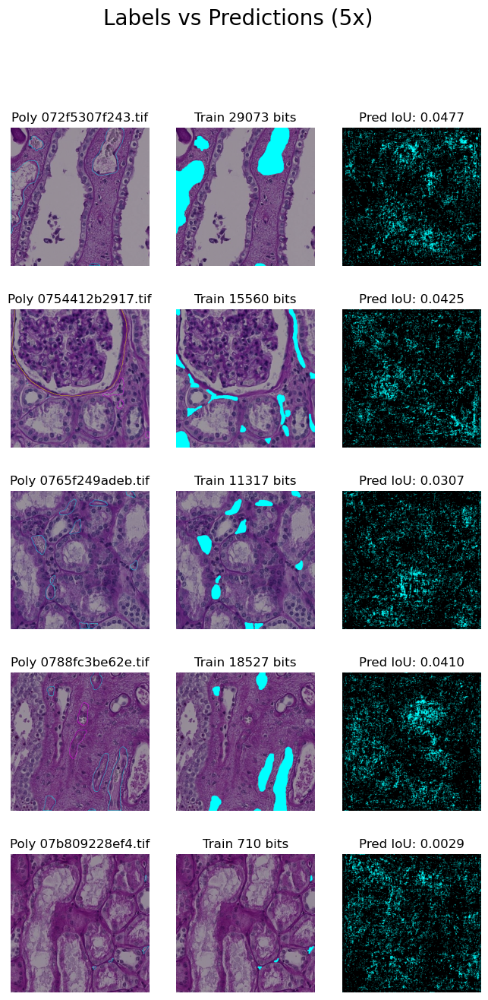

In [47]:
label_vs_pred(
    iseg_model, 
    TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', add_rotated=False),
    count=5, index = 42
    )

In [48]:
iseg_model = UNetInstanceSegmentation()

iseg_model.to(device)

loss_function = nn.BCEWithLogitsLoss() 
optimizer = optim.Adam(iseg_model.parameters(), lr=0.001)

dataset = TifImageDataset(f'{data_directory}/train/', f'{data_directory}/polygons.jsonl', count=100, add_rotated=True)
gen1 = torch.Generator().manual_seed(36)
training_dataset, validation_dataset = torch.utils.data.random_split(dataset, [0.78, 0.22], gen1)
train_loader = torch.utils.data.DataLoader(training_dataset, batch_size=32, shuffle=True)
validation_loader = torch.utils.data.DataLoader(validation_dataset, batch_size=64, shuffle=False)

average_loss = do_epochs(iseg_model, loss_function, optimizer, training_loader, validation_loader, epochs=2, verbose=False)

Annotated: 1633, Not Anotated: 5400
Total images: 100
EPOCH 1:
  TRAIN loss: 0.983, VALIDATION loss: 1.084, accuracy: 5469741.000, avg_mAP: 0.948
EPOCH 2:
  TRAIN loss: 1.102, VALIDATION loss: 0.708, accuracy: 5469741.000, avg_mAP: 0.948


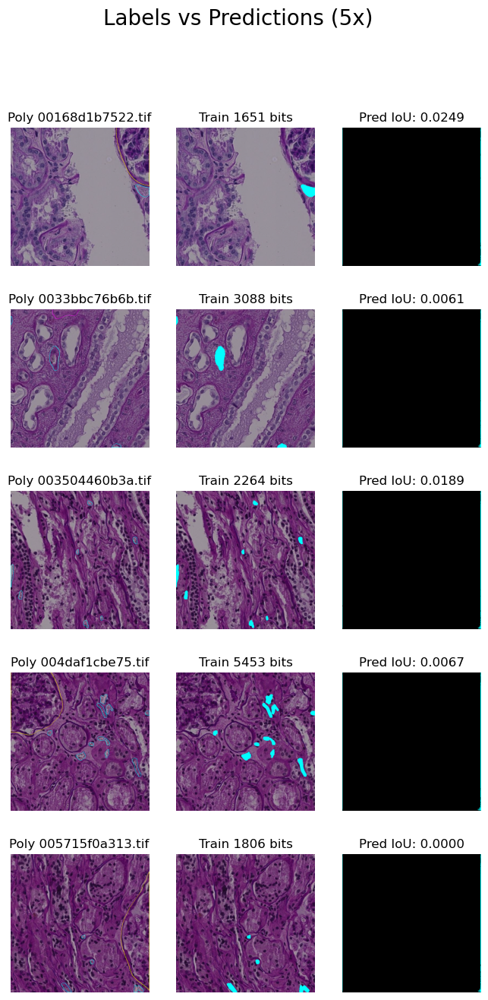

In [49]:

label_vs_pred(
    iseg_model, 
    dataset,
    count=5, index = 1
    )

In [50]:
from torchmetrics.detection import MeanAveragePrecision

def validate_model(model, dataloader):
    # Set the model in evaluation mode
    model.eval()

    # Create the MeanAveragePrecision metric
    mAP_metric = MeanAveragePrecision()  # We have 1 class for binary segmentation

    # Lists to store ground truth and prediction tensors
    all_targets = []
    all_predictions = []

    # Iterate over the dataloader
    with torch.no_grad():
        for batch in dataloader:
            inputs, targets = batch
            inputs = inputs.to('cuda')
            targets = targets.to('cuda')

            # Forward pass through the model to get predictions
            predictions = model(inputs)

            # Adjust the shapes of the predictions and targets
            # (batch, 1, 512, 512) to (batch, 512, 512)
            predictions = predictions.squeeze(1)
            targets = targets.squeeze(1)

            # Convert predictions and targets to binary values (0 or 1)
            predictions = (predictions > 0.5).float()
            targets = (targets > 0.5).float()

            all_targets.append(targets)
            all_predictions.append(predictions)

    # Concatenate the lists of tensors to create a single tensor
    all_targets = torch.cat(all_targets, dim=0)
    all_predictions = torch.cat(all_predictions, dim=0)

    # Calculate the mean average precision
    mAP_metric.update(all_predictions, all_targets)
    mean_average_precision = mAP_metric.compute()

    return mean_average_precision.item()

mAP = validate_model(model, validation_loader)

ModuleNotFoundError: No module named 'torchmetrics'

# Saving Model

In [ ]:
final_model = iseg_model
torch.save(model.state_dict(), f"{data_directory}/models/mymodel")


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=48bbd743-2622-46ec-99ec-b0bf1e40f98b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>